In [1]:
%cd ..

/home/horstl/git/Music-recognition


In [3]:
import IPython.display as ipd
from pathlib import Path
from PIL import Image
import torch
import torchaudio

from musicrecognition.train import get_song_paths
from musicrecognition.augmentation import get_augmenter
from musicrecognition.spectrogram import get_spectrogram_func
from musicrecognition.audio_dataset import AudioDataset
from musicrecognition.data_collate import create_collate_fn

def plot_spec(specgram):
    return Image.fromarray(((specgram - specgram.min()) / (specgram - specgram.min()).max() * 255).numpy().astype('uint8'))

In [12]:
data_root = Path('data')
songs_paths = get_song_paths(data_root / 'songs')
augmenter = get_augmenter(data_root / 'background_noises')
collate_fn = create_collate_fn(augmenter, 10, 30, 44100)
train_set = AudioDataset(songs_paths, 44100)
audio_loader = torch.utils.data.DataLoader(train_set, batch_size=4, num_workers=12, collate_fn=collate_fn)

anchors, positives, negatives = next(iter(audio_loader))

ipd.display(ipd.Audio(anchors[0], rate=44100))
ipd.display(ipd.Audio(positives[0], rate=44100))
ipd.display(ipd.Audio(negatives[1], rate=44100))

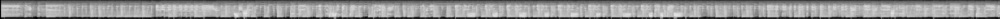

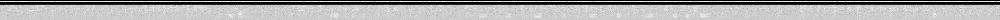

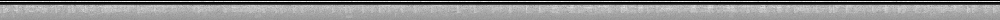

In [13]:
spectrogram_func = get_spectrogram_func(44100)
collate_fn = create_collate_fn(augmenter, 10, 30, 44100, spectrogram_func)
audio_loader_spec = torch.utils.data.DataLoader(train_set, batch_size=4, num_workers=12, collate_fn=collate_fn)

anchors, positives, negatives = next(iter(audio_loader_spec))

display(plot_spec(anchors[0]))
display(plot_spec(positives[0]))
display(plot_spec(negatives[0]))